<h1 style="color:darkblue; text-align:center;font-size:35px;">
Clinical and Financial Healthcare Analytics
</h1>

<h3 style="text-align:center;font-size:30px">
Healthcare Data Analysis using Python
</h3>

<h3 style="font-size:28px;color:#1F4E79;">
1.Project Introduction
</h3>

This project focuses on performing clinical and financial healthcare analytics using Python in Jupyter Notebook. The analysis is conducted on a healthcare dataset containing patient demographics, medical conditions, admission details, billing information, insurance providers, and hospital-related records.
The project also emphasizes the development of practical skills in Python programming, data handling, exploratory data analysis, data visualization, and healthcare data interpretation using Jupyter Notebook.

<h3 style="font-size:28px;color:#1F4E79;">
2.Project Objectives
</h3>

* To perform data cleaning and preprocessing for accurate analysis.

* To identify patterns and trends related to patient records, hospital admissions, billing details, and insurance information.

* To perform exploratory data analysis (EDA) and generate meaningful insights through data visualization techniques.

* To improve practical knowledge in Python programming, data handling, data visualization, and healthcare data interpretation using Jupyter Notebook.

<h3 style="font-size:28px;color:#1F4E79;">
3.Dataset Information
</h3>

The dataset used in this project is a raw healthcare dataset containing clinical and financial information related to patients, hospital admissions, billing details, insurance providers, medical conditions, and treatment records.

The original raw dataset file is stored as:

raw_healthcare_dataset.csv

The dataset undergoes data cleaning and preprocessing before performing exploratory data analysis and visualization

<h3 style="font-size:28px;color:#1F4E79;">
4.Importing Required Libraries
</h3>

The required Python libraries are imported to perform data handling, numerical computation, data visualization, and exploratory data analysis throughout the project.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

<h3 style="font-size:28px;color:#1F4E79;">
5.Loading the Dataset
</h3>

The raw healthcare dataset is loaded into a Pandas DataFrame for further analysis and preprocessing.

In [3]:
df = pd.read_csv("raw_healthcare_dataset.csv")

##Viewing the Dataset
The first few rows of the dataset are displayed to understand the structure, column names, and sample records present in the healthcare dataset.

In [4]:
df.head()

,Patient_ID,Age,Gender,Admission_Date,Discharge_Date,Hospital_Department,Length_of_Stay,Diagnosis,Treatment_Type,Blood_Pressure_Systolic,...,Smoking_Status,Num_Previous_Admissions,Discharge_Disposition,Admission_Type,Ethnicity,Marital_Status,State,Attending_Physician,Readmission_Risk,Copay_Amount
0,PT000001,69,Female,2023-01-31 00:00:00,2023-02-03 00:00:00,Gastroenterology,3,Asthma,Dialysis,136.0,...,Never,0,Home,Elective,Unknown,Separated,CA,Dr. Wilson,Low,0.0
1,PT000002,42,Other,2023-12-30 00:00:00,2024-01-03 00:00:00,Nephrology,4,COPD,Observation,139.0,...,Never,4,AMA,Urgent,Asian,Unknown,TX,Dr. Thomas,Medium,100.0
2,PT000003,27,Female,2022-05-10 00:00:00,2022-05-31 00:00:00,Psychiatry,21,Hypertension,Observation,111.0,...,Never,2,Transfer to Another Hospital,Emergency,Pacific Islander,Single,FL,Dr. Jones,Low,20.0
3,PT000004,30,Female,2023-07-18 00:00:00,2023-07-21 00:00:00,Cardiology,3,Lung Cancer,Medication,122.0,...,Never,4,Transfer to Another Hospital,Newborn,Hispanic or Latino,Widowed,NJ,Dr. Wilson,High,75.0
4,PT000005,39,Male,2023-02-04 00:00:00,2023-02-07 00:00:00,Orthopedics,3,Coronary Artery Disease,Surgery,146.0,...,Former,0,Transfer to Another Hospital,Urgent,Hispanic or Latino,Married,MD,Dr. Williams,Low,0.0


Each row represents one patient hospital admission record.
Each column represents an attribute related to the patient, treatment, or hospital administration.

<h3 style="font-size:28px;color:#1F4E79;">
6.Data Understanding
</h3>

This section focuses on understanding the structure, dimensions, data types, and overall characteristics of the healthcare dataset before performing data cleaning and analysis.

<h4 style="color:#2E8B57;">
6.1 Dataset Shape
</h4>

This step is important to confirm that the dataset meets the project requirement of having a sufficient number of records and features.

In [5]:
df.shape

(100000, 30)

The first value represents the total number of rows (patient records).
The second value represents the total number of columns (features).
There are 100000 patient records and 30 attributes describing each patient.

<h4 style="color:#2E8B57;">
6.2 Dataset Information
</h4>

I use the info() function to obtain the total number of entries,column names,data types and non-null values.This helps in understanding the quality of the dataset before further analysis.

In [6]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 30 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Patient_ID                100000 non-null  str    
 1   Age                       100000 non-null  int64  
 2   Gender                    100000 non-null  str    
 3   Admission_Date            100000 non-null  str    
 4   Discharge_Date            100000 non-null  str    
 5   Hospital_Department       100000 non-null  str    
 6   Length_of_Stay            100000 non-null  int64  
 7   Diagnosis                 100000 non-null  str    
 8   Treatment_Type            100000 non-null  str    
 9   Blood_Pressure_Systolic   96001 non-null   float64
 10  Blood_Pressure_Diastolic  95945 non-null   float64
 11  Heart_Rate                96907 non-null   float64
 12  Temperature_Celsius       91948 non-null   float64
 13  Insurance_Provider        93937 non-null   str    
 14  

What this output tells
1. Dataset size
100,000 rows (entries) → quite a large dataset 30 columns → a mix of patient info, medical data, and billing
2. Data types
int64 → numerical (e.g., Age, Length_of_Stay)
float64 → continuous values (e.g., Blood Pressure, BMI)
str → categorical/text (e.g., Gender, Diagnosis)
3. Missing values 
Some columns don’t have full 100,000 values:
Examples:
Blood_Pressure_Systolic → 96,001 non-null → ~4% missing
Blood_Pressure_Diastolic → 95,945 non-null
Temperature_Celsius → 91,948 non-null
BMI → 94,933 non-null
Insurance_Provider → 93,937 non-null
This means I must handle missing data before analysis or modeling.
5. Clean columns (no missing values):
Patient_ID,
Age,
Gender,
Admission_Date,
Discharge_Date,
Hospital_Department,
Length_of_Stay,
Diagnosis,
Treatment_Type,
Num_Previous_Admissions,
Admission_Type,
State

<h4 style="color:#2E8B57;">
6.3 Statistical Summary
</h4>
The describe() function is used to generate a statistical summary of the numerical columns in the dataset. It provides important statistical measures such as count, mean, standard deviation, minimum value, maximum value, and quartile values, which help in understanding the distribution of the data.

In [7]:
df.describe()

,Age,Length_of_Stay,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Heart_Rate,Temperature_Celsius,Total_Bill_Amount,BMI,Glucose_Level,Cholesterol_Level,Oxygen_Saturation,Num_Previous_Admissions,Copay_Amount
count,100000.000000,100000.000000,96001.000000,95945.000000,96907.000000,91948.000000,97953.000000,94933.000000,92993.000000,93141.000000,94066.000000,100000.000000,96990.000000
mean,54.036730,5.103570,129.511755,81.542175,74.451691,36.998478,21896.058329,27.538182,104.818771,194.244833,97.467165,1.785550,81.792195
std,21.090672,4.886735,14.927694,9.874405,14.856776,0.602296,26724.728345,5.441790,24.163649,34.845411,1.445811,2.051566,87.461921
min,18.000000,1.000000,90.000000,60.000000,40.000000,35.000000,500.000000,15.000000,60.000000,100.000000,90.500000,0.000000,0.000000
25%,36.000000,2.000000,119.000000,75.000000,64.000000,36.600000,6831.170000,23.800000,88.000000,171.000000,96.500000,0.000000,30.000000
50%,54.000000,4.000000,129.000000,82.000000,74.000000,37.000000,13473.910000,27.500000,104.000000,194.000000,97.500000,1.000000,50.000000
75%,72.000000,6.000000,140.000000,88.000000,85.000000,37.400000,26374.280000,31.200000,121.000000,218.000000,98.500000,3.000000,100.000000
max,90.000000,30.000000,180.000000,120.000000,120.000000,39.800000,250000.000000,49.400000,204.000000,350.000000,100.000000,10.000000,500.000000


<h3 style="font-size:28px;color:#1F4E79;">
7.Data Cleaning and Preprocessing
</h3>

<h4 style="color:#2E8B57;">
7.1 Checking and Handling Missing Values
</h4>

In [8]:
df.isnull().sum()
df.isnull().mean()*100

Patient_ID                  0.000
Age                         0.000
Gender                      0.000
Admission_Date              0.000
Discharge_Date              0.000
Hospital_Department         0.000
Length_of_Stay              0.000
Diagnosis                   0.000
Treatment_Type              0.000
Blood_Pressure_Systolic     3.999
Blood_Pressure_Diastolic    4.055
Heart_Rate                  3.093
Temperature_Celsius         8.052
Insurance_Provider          6.063
Total_Bill_Amount           2.047
Blood_Type                  9.848
BMI                         5.067
Glucose_Level               7.007
Cholesterol_Level           6.859
Oxygen_Saturation           5.934
Smoking_Status              4.976
Num_Previous_Admissions     0.000
Discharge_Disposition       0.000
Admission_Type              0.000
Ethnicity                   8.004
Marital_Status              5.087
State                       0.000
Attending_Physician         0.000
Readmission_Risk            4.019
Copay_Amount  

The dataset is checked for missing values to identify null entries present in each column.Detecting missing values is an important step in data cleaning and preprocessing.

In [8]:
###Handling Missing values:

In this dataset, missing values were handled based on the type of variable to ensure data consistency and maintain data integrity.
Categorical columns: Missing values were filled using Mode (most frequent value)
Numerical columns: Missing values were filled using Median, as it is less affected by outliers
This approach helps maintain the natural distribution of the dataset without data loss.

In [9]:
#Numerical columns → Median

In [9]:
df['Blood_Pressure_Systolic'] = df['Blood_Pressure_Systolic'].fillna(df['Blood_Pressure_Systolic'].median())
df['Blood_Pressure_Diastolic'] = df['Blood_Pressure_Diastolic'].fillna(df['Blood_Pressure_Diastolic'].median())
df['Heart_Rate'] = df['Heart_Rate'].fillna(df['Heart_Rate'].median())
df['Temperature_Celsius'] = df['Temperature_Celsius'].fillna(df['Temperature_Celsius'].median())
df['Total_Bill_Amount'] = df['Total_Bill_Amount'].fillna(df['Total_Bill_Amount'].median())
df['BMI'] = df['BMI'].fillna(df['BMI'].median())
df['Glucose_Level'] = df['Glucose_Level'].fillna(df['Glucose_Level'].median())
df['Cholesterol_Level'] = df['Cholesterol_Level'].fillna(df['Cholesterol_Level'].median())
df['Oxygen_Saturation'] = df['Oxygen_Saturation'].fillna(df['Oxygen_Saturation'].median())
df['Copay_Amount'] = df['Copay_Amount'].fillna(df['Copay_Amount'].median())

In [11]:
#Categorical columns → Mode

In [10]:
df['Marital_Status' ] = df['Marital_Status'].fillna(df['Marital_Status'].mode()[0])
df['Ethnicity'] = df['Ethnicity'].fillna(df['Ethnicity'].mode()[0])
df['Insurance_Provider'] = df['Insurance_Provider'].fillna(df['Insurance_Provider'].mode()[0])
df['Blood_Type'] = df['Blood_Type'].fillna(df['Blood_Type'].mode()[0])
df['Smoking_Status'] = df['Smoking_Status'].fillna(df['Smoking_Status'].mode()[0])
df['Readmission_Risk'] = df['Readmission_Risk'].fillna(df['Readmission_Risk'].mode()[0])

Categorical variables were imputed using mode, while numerical variables were imputed using median to handle missing values effectively without losing important data.

<h4 style="color:#2E8B57;">
7.2 Checking Duplicate Records
</h4>
Duplicate entries are identified and removed to improve data quality and avoid redundancy.

In [11]:
df.duplicated().sum()

np.int64(0)

The dataset contains no duplicate records

<h4 style="color:#2E8B57;">
7.3 Check Data Types
</h4>
Ensure columns have correct data types

In [12]:
df.dtypes

Patient_ID                      str
Age                           int64
Gender                          str
Admission_Date                  str
Discharge_Date                  str
Hospital_Department             str
Length_of_Stay                int64
Diagnosis                       str
Treatment_Type                  str
Blood_Pressure_Systolic     float64
Blood_Pressure_Diastolic    float64
Heart_Rate                  float64
Temperature_Celsius         float64
Insurance_Provider              str
Total_Bill_Amount           float64
Blood_Type                      str
BMI                         float64
Glucose_Level               float64
Cholesterol_Level           float64
Oxygen_Saturation           float64
Smoking_Status                  str
Num_Previous_Admissions       int64
Discharge_Disposition           str
Admission_Type                  str
Ethnicity                       str
Marital_Status                  str
State                           str
Attending_Physician         

In the dataset, Admission Date and Discharge Date were initially stored as string (object) data types. These columns were converted into proper datetime format to enable time-based analysis.

In [13]:
df['Admission_Date'] = pd.to_datetime(df['Admission_Date'])
df['Discharge_Date'] = pd.to_datetime(df['Discharge_Date'])

Admission and Discharge dates were converted from string format to datetime format to enable time-based analysis. 

<h4 style="color:#2E8B57;">
7.4 Standardize Column Names
</h4>

In [14]:
df.columns = df.columns.str.lower().str.strip().str.replace(" ", "_")

Column names were standardized by converting them to lowercase, removing extra spaces, and replacing spaces with underscores to ensure consistency and ease of analysis

<h4 style="color:#2E8B57;">
7.5 Data Validation
</h4>
Check for impossible values

In [17]:
##1. Age cannot be negative or too high

In [14]:
df[(df['age']<0) | (df['age']>120)]

,patient_id,age,gender,admission_date,discharge_date,hospital_department,length_of_stay,diagnosis,treatment_type,blood_pressure_systolic,...,smoking_status,num_previous_admissions,discharge_disposition,admission_type,ethnicity,marital_status,state,attending_physician,readmission_risk,copay_amount


In [19]:
##2.Removing unrealistic values:Validate Oxygen Saturation,Validate Heart Rate

In [15]:
df = df[df['oxygen_saturation'].between(70, 100)]

In [16]:
df = df[df['heart_rate'].between(40, 180)]

Data validation was performed to ensure that all values were realistic and logically consistent. Invalid records such as negative ages and unrealistic vital signs were identified and removed to improve data quality.

<h4 style="color:#2E8B57;">
7.6 Create New Columns
</h4>
In this step, new meaningful features were created from existing data to improve analysis and extract deeper insights from the dataset.

In [22]:
##1.Creating Age Group Column

In [15]:
bins = [0, 18, 35, 50, 65, 120]
labels = ['Child', 'Young Adult', 'Adult', 'Middle Age', 'Senior']
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels)

An Age Group feature was created by categorizing patients into defined age ranges to simplify analysis and improve interpretation of demographic patterns.

In [24]:
##2.Creating Billing Category Column

In [16]:
df['billing_category'] = pd.cut(df['total_bill_amount'],
bins = [0,50000,100000,200000,float('inf')],
labels = ['Low','Medium','High','Very High'])

A billing Category feature was created by grouping total bill amounts into defined ranges to simplify financial analysis and understand patient cost distribution more effectively.

In [26]:
##3.Creating Stay Category Column

In [18]:
bins = [0, 2, 5, 10, 30, 365]
labels = ['Very Short', 'Short', 'Moderate', 'Long', 'Very Long']

df['stay_category'] = pd.cut(df['length_of_stay'], bins=bins, labels=labels)

A Stay Category feature was created by grouping hospital stay duration into defined ranges to better understand patient admission patterns and hospitalization duration trends.

In [75]:
##4.Creating Admission Month Column

In [19]:
df['admission_month'] = df['admission_date'].dt.month_name()

An Admission Month feature was created from the admission date column to enable monthly trend analysis and identify seasonal patterns in hospital admissions.

In [20]:
df[['age_group', 'billing_category','stay_category','admission_month']].head()

,age_group,billing_category,stay_category,admission_month
0,Senior,Low,Short,January
1,Adult,Medium,Short,December
2,Young Adult,Low,Long,May
3,Young Adult,High,Short,July
4,Adult,Low,Short,February


In [21]:
df.columns

Index(['patient_id', 'age', 'gender', 'admission_date', 'discharge_date',
       'hospital_department', 'length_of_stay', 'diagnosis', 'treatment_type',
       'blood_pressure_systolic', 'blood_pressure_diastolic', 'heart_rate',
       'temperature_celsius', 'insurance_provider', 'total_bill_amount',
       'blood_type', 'bmi', 'glucose_level', 'cholesterol_level',
       'oxygen_saturation', 'smoking_status', 'num_previous_admissions',
       'discharge_disposition', 'admission_type', 'ethnicity',
       'marital_status', 'state', 'attending_physician', 'readmission_risk',
       'copay_amount', 'age_group', 'billing_category', 'stay_category',
       'admission_month'],
      dtype='str')

<h4 style="color:#2E8B57;">
7.7 Rearrangement of Columns
</h4>

In [22]:
df = df[['patient_id','age','age_group','gender','marital_status','blood_type','smoking_status','state','ethnicity',
         'diagnosis','blood_pressure_systolic', 'blood_pressure_diastolic','heart_rate','temperature_celsius','oxygen_saturation','bmi',
         'glucose_level','cholesterol_level','readmission_risk',
          'treatment_type','hospital_department','admission_type','admission_date','discharge_date','admission_month','length_of_stay','stay_category','num_previous_admissions','attending_physician',
          'insurance_provider','discharge_disposition',
         'total_bill_amount','billing_category','copay_amount']]

The dataset columns were rearranged into logical groups such as patient details, medical details, hospital information, and billing details to improve readability and facilitate better exploratory analysis.

<h4 style="color:#2E8B57;">
7.8 Filtering
</h4>

In [ ]:
##1.Filter the rows of Emergency Admissions

In [23]:
df[df['admission_type'] == 'Emergency']

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
2,PT000003,27,Young Adult,Female,Single,B+,Never,FL,Pacific Islander,Hypertension,...,May,21,Long,2,Dr. Jones,Medicare,Transfer to Another Hospital,6164.52,Low,20.0
5,PT000006,73,Senior,Male,Single,O-,Former,MO,Other,COPD,...,December,1,Very Short,1,Dr. Jones,Aetna,AMA,152352.78,High,30.0
8,PT000009,85,Senior,Male,Widowed,A-,Never,GA,Hispanic or Latino,Hypertension,...,April,6,Moderate,0,Dr. Smith,Centene,Expired,33153.44,Low,50.0
11,PT000012,39,Adult,Male,Single,O-,Never,MO,Unknown,Coronary Artery Disease,...,March,5,Short,2,Dr. Jackson,Humana,Expired,5254.09,Low,30.0
12,PT000013,48,Adult,Female,Widowed,O+,Never,MD,Other,Hypertension,...,October,5,Short,2,Dr. Jackson,Aetna,AMA,12459.95,Low,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,PT099992,33,Young Adult,Female,Single,O-,Never,GA,Other,Asthma,...,May,2,Very Short,1,Dr. Jackson,Blue Cross Blue Shield,Transfer to Another Hospital,6160.29,Low,75.0
99994,PT099995,58,Middle Age,Female,Widowed,B+,Former,VA,White,Asthma,...,September,4,Short,1,Dr. Martinez,Aetna,Expired,42762.99,Low,100.0
99996,PT099997,86,Senior,Female,Unknown,AB-,Never,WA,Other,Sepsis,...,January,1,Very Short,0,Dr. Thomas,Medicare,Expired,6053.98,Low,75.0
99997,PT099998,29,Young Adult,Female,Separated,O-,Never,CA,Unknown,Hypertension,...,December,10,Moderate,4,Dr. Thompson,Anthem,Home Health Care,16256.42,Low,50.0


The dataset was filtered to extract patients admitted under emergency conditions. This helps analyze emergency cases separately and understand their treatment and billing patterns.

In [74]:
##2.Filter the rows of High Billing Patients

In [26]:
df[df['total_bill_amount']>50000]

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
1,PT000002,42,Adult,Other,Unknown,A-,Never,TX,Asian,COPD,...,December,4,Short,4,Dr. Thomas,Anthem,AMA,62276.23,Medium,100.0
3,PT000004,30,Young Adult,Female,Widowed,B+,Never,NJ,Hispanic or Latino,Lung Cancer,...,July,3,Short,4,Dr. Wilson,Kaiser Permanente,Transfer to Another Hospital,153274.93,High,75.0
5,PT000006,73,Senior,Male,Single,O-,Former,MO,Other,COPD,...,December,1,Very Short,1,Dr. Jones,Aetna,AMA,152352.78,High,30.0
16,PT000017,24,Young Adult,Male,Married,A-,Unknown,WI,Black or African American,Pneumonia,...,August,3,Short,0,Dr. Smith,Humana,Skilled Nursing Facility,84811.57,Medium,75.0
32,PT000033,62,Middle Age,Female,Widowed,A-,Never,FL,Unknown,Chronic Kidney Disease,...,April,1,Very Short,0,Dr. Smith,Humana,Transfer to Another Hospital,53550.13,Medium,75.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99938,PT099939,74,Senior,Male,Unknown,O-,Former,OH,Unknown,Migraine,...,January,3,Short,2,Dr. Brown,Aetna,Transfer to Another Hospital,71430.28,Medium,200.0
99940,PT099941,66,Senior,Male,Unknown,AB+,Former,IN,Other,Sepsis,...,December,1,Very Short,0,Dr. Hernandez,Cigna,Rehabilitation,72873.76,Medium,0.0
99953,PT099954,66,Senior,Female,Separated,AB+,Former,GA,Pacific Islander,Atrial Fibrillation,...,June,5,Short,2,Dr. Johnson,Kaiser Permanente,Expired,85861.03,Medium,20.0
99967,PT099968,84,Senior,Female,Single,O+,Never,TN,American Indian,Type 2 Diabetes,...,May,2,Very Short,4,Dr. Wilson,Centene,Expired,53264.06,Medium,150.0


Patients with billing amounts greater than 50,000 were filtered to identify high-cost treatments and hospital expenses.

In [33]:
##3.Filter the rows of Diabetic Patients

In [27]:
 df[df['diagnosis'] == 'Type 2 Diabetes']

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
15,PT000016,52,Middle Age,Female,Unknown,AB+,Former,TX,Black or African American,Type 2 Diabetes,...,May,6,Moderate,2,Dr. Williams,Humana,AMA,14683.62,Low,50.0
22,PT000023,26,Young Adult,Female,Married,O-,Former,NJ,American Indian,Type 2 Diabetes,...,April,10,Moderate,1,Dr. Miller,UnitedHealth,Expired,9407.65,Low,250.0
37,PT000038,79,Senior,Male,Unknown,AB+,Never,AZ,White,Type 2 Diabetes,...,July,1,Very Short,6,Dr. Johnson,Blue Cross Blue Shield,Skilled Nursing Facility,6766.13,Low,30.0
51,PT000052,53,Middle Age,Female,Unknown,AB+,Never,VA,American Indian,Type 2 Diabetes,...,August,1,Very Short,1,Dr. Martin,Cigna,AMA,13473.91,Low,150.0
168,PT000169,23,Young Adult,Male,Widowed,AB-,Unknown,NJ,Other,Type 2 Diabetes,...,September,2,Very Short,0,Dr. White,Anthem,AMA,1805.92,Low,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99967,PT099968,84,Senior,Female,Single,O+,Never,TN,American Indian,Type 2 Diabetes,...,May,2,Very Short,4,Dr. Wilson,Centene,Expired,53264.06,Medium,150.0
99968,PT099969,89,Senior,Other,Divorced,B-,Unknown,PA,Asian,Type 2 Diabetes,...,October,7,Moderate,2,Dr. White,Anthem,Transfer to Another Hospital,15704.03,Low,75.0
99981,PT099982,70,Senior,Male,Separated,A+,Former,NC,Unknown,Type 2 Diabetes,...,May,21,Long,0,Dr. Taylor,UnitedHealth,Home,22179.14,Low,0.0
99983,PT099984,34,Young Adult,Male,Divorced,B-,Never,TX,Black or African American,Type 2 Diabetes,...,March,5,Short,5,Dr. Johnson,Medicare,Expired,59700.33,Medium,150.0


The dataset was filtered to extract diabetic patients for analyzing disease patterns, treatment details, and healthcare costs related to diabetes.

In [76]:
##4.Filter the rows of  High Readmission Risk Patients

In [28]:
df[df['readmission_risk'] == 'High']

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
3,PT000004,30,Young Adult,Female,Widowed,B+,Never,NJ,Hispanic or Latino,Lung Cancer,...,July,3,Short,4,Dr. Wilson,Kaiser Permanente,Transfer to Another Hospital,153274.93,High,75.0
12,PT000013,48,Adult,Female,Widowed,O+,Never,MD,Other,Hypertension,...,October,5,Short,2,Dr. Jackson,Aetna,AMA,12459.95,Low,30.0
17,PT000018,49,Adult,Male,Separated,AB-,Never,FL,Pacific Islander,Depression,...,February,5,Short,0,Dr. Williams,Anthem,Home,18493.22,Low,50.0
33,PT000034,23,Young Adult,Female,Divorced,B-,Never,TN,Black or African American,Sepsis,...,December,21,Long,4,Dr. Brown,Humana,Expired,30556.14,Low,30.0
34,PT000035,80,Senior,Female,Divorced,B+,Current,MI,American Indian,Appendicitis,...,May,7,Moderate,2,Dr. Williams,Medicare,AMA,11940.30,Low,75.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99982,PT099983,18,Child,Male,Married,A-,Former,MO,Hispanic or Latino,Sepsis,...,April,1,Very Short,1,Dr. Thomas,Blue Cross Blue Shield,Home,17483.43,Low,75.0
99987,PT099988,87,Senior,Female,Single,B+,Unknown,WA,American Indian,Pneumonia,...,July,1,Very Short,4,Dr. Jones,Centene,Transfer to Another Hospital,15672.14,Low,100.0
99992,PT099993,34,Young Adult,Male,Separated,B+,Unknown,OH,Other,Breast Cancer,...,June,1,Very Short,0,Dr. Moore,Cigna,Rehabilitation,35303.75,Low,30.0
99993,PT099994,47,Adult,Other,Unknown,A+,Never,TN,Pacific Islander,Migraine,...,August,4,Short,1,Dr. Taylor,Blue Cross Blue Shield,Rehabilitation,9870.10,Low,50.0


The dataset was filtered to identify patients with high readmission risk for analyzing factors associated with repeated hospital admissions.

In [ ]:
##5.Filter the rows of Patients above 60

In [29]:
df[df['age']>60]

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
0,PT000001,69,Senior,Female,Separated,AB+,Never,CA,Unknown,Asthma,...,January,3,Short,0,Dr. Wilson,Medicare,Home,5440.39,Low,0.0
5,PT000006,73,Senior,Male,Single,O-,Former,MO,Other,COPD,...,December,1,Very Short,1,Dr. Jones,Aetna,AMA,152352.78,High,30.0
6,PT000007,90,Senior,Female,Unknown,B+,Former,PA,Black or African American,Pneumonia,...,November,6,Moderate,8,Dr. Smith,Anthem,Home Health Care,18336.46,Low,75.0
8,PT000009,85,Senior,Male,Widowed,A-,Never,GA,Hispanic or Latino,Hypertension,...,April,6,Moderate,0,Dr. Smith,Centene,Expired,33153.44,Low,50.0
10,PT000011,67,Senior,Female,Unknown,AB+,Current,WA,Pacific Islander,Asthma,...,November,6,Moderate,1,Dr. Smith,Cigna,AMA,27818.53,Low,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99977,PT099978,78,Senior,Female,Separated,O-,Never,IL,White,Breast Cancer,...,June,2,Very Short,6,Dr. Moore,Cigna,Home,15249.49,Low,30.0
99981,PT099982,70,Senior,Male,Separated,A+,Former,NC,Unknown,Type 2 Diabetes,...,May,21,Long,0,Dr. Taylor,UnitedHealth,Home,22179.14,Low,0.0
99987,PT099988,87,Senior,Female,Single,B+,Unknown,WA,American Indian,Pneumonia,...,July,1,Very Short,4,Dr. Jones,Centene,Transfer to Another Hospital,15672.14,Low,100.0
99996,PT099997,86,Senior,Female,Unknown,AB-,Never,WA,Other,Sepsis,...,January,1,Very Short,0,Dr. Thomas,Medicare,Expired,6053.98,Low,75.0


Patients above the age of 60 were filtered to analyze healthcare patterns among senior citizens.

In [ ]:
##6.Filter the rows of High Heart Rate Patients

In [30]:
df[df['heart_rate'] > 100]

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
20,PT000021,40,Adult,Female,Unknown,B+,Never,NC,Asian,Chronic Kidney Disease,...,March,7,Moderate,2,Dr. Johnson,Blue Cross Blue Shield,AMA,8709.55,Low,100.0
21,PT000022,44,Adult,Female,Separated,A-,Never,NY,Hispanic or Latino,Hypertension,...,January,3,Short,0,Dr. Taylor,Blue Cross Blue Shield,Expired,11870.98,Low,50.0
33,PT000034,23,Young Adult,Female,Divorced,B-,Never,TN,Black or African American,Sepsis,...,December,21,Long,4,Dr. Brown,Humana,Expired,30556.14,Low,30.0
44,PT000045,54,Middle Age,Male,Unknown,A+,Never,AZ,Unknown,Hip Fracture,...,February,2,Very Short,4,Dr. Hernandez,Medicare,Skilled Nursing Facility,5703.79,Low,20.0
64,PT000065,87,Senior,Other,Separated,B+,Current,NC,American Indian,COPD,...,May,3,Short,3,Dr. Thompson,Cigna,Home,28512.11,Low,200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99952,PT099953,39,Adult,Female,Married,B-,Current,FL,American Indian,UTI,...,January,1,Very Short,0,Dr. Thomas,Medicaid,Home,2233.62,Low,50.0
99971,PT099972,88,Senior,Male,Widowed,O-,Never,MA,Unknown,Asthma,...,June,6,Moderate,5,Dr. Martin,Centene,Home,6092.84,Low,50.0
99980,PT099981,28,Young Adult,Other,Unknown,B-,Never,MA,Other,Migraine,...,March,7,Moderate,4,Dr. Moore,Medicaid,Expired,5579.00,Low,50.0
99992,PT099993,34,Young Adult,Male,Separated,B+,Unknown,OH,Other,Breast Cancer,...,June,1,Very Short,0,Dr. Moore,Cigna,Rehabilitation,35303.75,Low,30.0


The filtered records represent patients with high heart rates, helping identify possible cardiac or stress-related conditions.

In [36]:
##7.Filtering Obese Patients based on BMI values

In [31]:
df[df['bmi'] > 30]

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
2,PT000003,27,Young Adult,Female,Single,B+,Never,FL,Pacific Islander,Hypertension,...,May,21,Long,2,Dr. Jones,Medicare,Transfer to Another Hospital,6164.52,Low,20.0
12,PT000013,48,Adult,Female,Widowed,O+,Never,MD,Other,Hypertension,...,October,5,Short,2,Dr. Jackson,Aetna,AMA,12459.95,Low,30.0
14,PT000015,47,Adult,Male,Widowed,B-,Former,PA,Asian,Anxiety Disorder,...,May,1,Very Short,0,Dr. Johnson,Blue Cross Blue Shield,Home Health Care,23138.37,Low,0.0
24,PT000025,42,Adult,Female,Single,B+,Former,TX,Other,Sepsis,...,October,7,Moderate,2,Dr. Jackson,Anthem,AMA,36907.34,Low,100.0
31,PT000032,24,Young Adult,Male,Widowed,AB+,Never,PA,Other,Coronary Artery Disease,...,May,1,Very Short,0,Dr. Thompson,Medicare,Expired,12863.87,Low,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99982,PT099983,18,Child,Male,Married,A-,Former,MO,Hispanic or Latino,Sepsis,...,April,1,Very Short,1,Dr. Thomas,Blue Cross Blue Shield,Home,17483.43,Low,75.0
99985,PT099986,47,Adult,Male,Married,A-,Never,WI,Pacific Islander,Anxiety Disorder,...,October,2,Very Short,1,Dr. Thomas,Centene,Home Health Care,8484.90,Low,30.0
99988,PT099989,45,Adult,Female,Divorced,O-,Current,WI,Hispanic or Latino,Osteoarthritis,...,May,5,Short,1,Dr. Miller,Medicaid,Home,17086.91,Low,30.0
99989,PT099990,54,Middle Age,Female,Single,AB-,Former,IN,American Indian,Depression,...,January,10,Moderate,0,Dr. Moore,Humana,Home,8444.97,Low,250.0


The filtered data contains obese patients based on BMI values greater than 30.

<h4 style="color:#2E8B57;">
7.9 Aggregation
</h4>

In [ ]:
##1.Average Billing by Insurance Provider

In [32]:
df.groupby('insurance_provider')['total_bill_amount'].mean()

insurance_provider
Aetna                     21772.408132
Anthem                    21909.973536
Blue Cross Blue Shield    21598.207024
Centene                   21992.524389
Cigna                     21532.896558
Humana                    21640.154781
Kaiser Permanente         21733.108671
Medicaid                  21931.427181
Medicare                  21646.291906
UnitedHealth              21536.609079
Name: total_bill_amount, dtype: float64

This aggregation calculates the average billing amount for each insurance provider.

In [102]:
##2.Average Length of Stay by Admission Type

In [33]:
df.groupby('admission_type')['length_of_stay'].mean()

admission_type
Elective     5.119057
Emergency    5.086457
Newborn      5.099421
Urgent       5.110914
Name: length_of_stay, dtype: float64

This aggregation shows the average hospital stay duration for different admission types

In [39]:
##3.Patient Count by Diagnosis

In [34]:
df.groupby('diagnosis')['patient_id'].count()

diagnosis
Anxiety Disorder           5000
Appendicitis               4938
Asthma                     5034
Atrial Fibrillation        4959
Breast Cancer              4877
COPD                       5030
Chronic Kidney Disease     5017
Coronary Artery Disease    5144
Depression                 5018
Heart Failure              5123
Hip Fracture               4947
Hypertension               5012
Lung Cancer                5053
Migraine                   4992
Osteoarthritis             4888
Pneumonia                  4991
Sepsis                     4954
Stroke                     5055
Type 2 Diabetes            4854
UTI                        5114
Name: patient_id, dtype: int64

This aggregation calculates the total number of patients for each diagnosis category.

In [42]:
##4.Average Oxygen Saturation by Age Group

In [35]:
df.groupby('age_group')['oxygen_saturation'].mean()

age_group
Child          97.505666
Young Adult    97.467299
Adult          97.476602
Middle Age     97.479444
Senior         97.458225
Name: oxygen_saturation, dtype: float64

This aggregation shows the average oxygen saturation levels across different age groups.

In [45]:
##5.Average Blood Pressure by Gender

In [36]:
df.groupby('gender')[['blood_pressure_systolic', 'blood_pressure_diastolic']].mean()

,blood_pressure_systolic,blood_pressure_diastolic
gender,,
Female,129.408875,81.529717
Male,129.569416,81.595439
Other,129.595151,81.515775


This aggregation calculates the average systolic and diastolic blood pressure for each gender.

<h4 style="color:#2E8B57;">
7.10 Final Dataset Verification
</h4>

In [ ]:
#1.check dataset structure

In [24]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 34 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   patient_id                100000 non-null  str           
 1   age                       100000 non-null  int64         
 2   age_group                 100000 non-null  category      
 3   gender                    100000 non-null  str           
 4   marital_status            100000 non-null  str           
 5   blood_type                100000 non-null  str           
 6   smoking_status            100000 non-null  str           
 7   state                     100000 non-null  str           
 8   ethnicity                 100000 non-null  str           
 9   diagnosis                 100000 non-null  str           
 10  blood_pressure_systolic   100000 non-null  float64       
 11  blood_pressure_diastolic  100000 non-null  float64       
 12  heart_rate    

In [ ]:
#2.Verify Misssing Values

In [25]:
df.isnull().sum()

patient_id                  0
age                         0
age_group                   0
gender                      0
marital_status              0
blood_type                  0
smoking_status              0
state                       0
ethnicity                   0
diagnosis                   0
blood_pressure_systolic     0
blood_pressure_diastolic    0
heart_rate                  0
temperature_celsius         0
oxygen_saturation           0
bmi                         0
glucose_level               0
cholesterol_level           0
readmission_risk            0
treatment_type              0
hospital_department         0
admission_type              0
admission_date              0
discharge_date              0
admission_month             0
length_of_stay              0
stay_category               0
num_previous_admissions     0
attending_physician         0
insurance_provider          0
discharge_disposition       0
total_bill_amount           0
billing_category            0
copay_amou

In [ ]:
#3.Check Duplicate Records

In [26]:
df.duplicated().sum()

np.int64(0)

In [ ]:
#4.View Final Dataset

In [27]:
df.head()

,patient_id,age,age_group,gender,marital_status,blood_type,smoking_status,state,ethnicity,diagnosis,...,admission_month,length_of_stay,stay_category,num_previous_admissions,attending_physician,insurance_provider,discharge_disposition,total_bill_amount,billing_category,copay_amount
0,PT000001,69,Senior,Female,Separated,AB+,Never,CA,Unknown,Asthma,...,January,3,Short,0,Dr. Wilson,Medicare,Home,5440.39,Low,0.0
1,PT000002,42,Adult,Other,Unknown,A-,Never,TX,Asian,COPD,...,December,4,Short,4,Dr. Thomas,Anthem,AMA,62276.23,Medium,100.0
2,PT000003,27,Young Adult,Female,Single,B+,Never,FL,Pacific Islander,Hypertension,...,May,21,Long,2,Dr. Jones,Medicare,Transfer to Another Hospital,6164.52,Low,20.0
3,PT000004,30,Young Adult,Female,Widowed,B+,Never,NJ,Hispanic or Latino,Lung Cancer,...,July,3,Short,4,Dr. Wilson,Kaiser Permanente,Transfer to Another Hospital,153274.93,High,75.0
4,PT000005,39,Adult,Male,Married,O-,Former,MD,Hispanic or Latino,Coronary Artery Disease,...,February,3,Short,0,Dr. Williams,Humana,Transfer to Another Hospital,3458.15,Low,0.0


In [ ]:
#5.Check Final Shape

In [28]:
df.shape

(100000, 34)

In [ ]:
#6.Save Cleaned Dataset

In [29]:
df.to_csv("cleaned_healthcare_dataset.csv", index=False)

>After completing all preprocessing steps, the dataset was finalized by verifying data types, checking missing values and duplicates, and confirming the final dataset structure before performing exploratory data analysis.

<h3 style="font-size:30px;color:#1F4E79;">
8.Exploratory Data Analysis
</h3>

<h4 style="font-size:20px;color:#2E8B57;">
A.Univariate Analysis
</h4>
The univariate analysis was performed to examine the distribution and characteristics of individual variables in the dataset. It helps identify patterns, trends, and possible outliers within each feature.

In [104]:
##1.Gender Distribution

In [44]:
df['gender'].value_counts()

gender
Female    49147
Male      47842
Other      3011
Name: count, dtype: int64

The analysis of gender distribution shows the proportion of male and female patients present in the dataset.

In [106]:
##2.Diagnosis Distribution

In [45]:
df['diagnosis'].value_counts().head(10)

diagnosis
Coronary Artery Disease    5144
Heart Failure              5123
UTI                        5114
Stroke                     5055
Lung Cancer                5053
Asthma                     5034
COPD                       5030
Depression                 5018
Chronic Kidney Disease     5017
Hypertension               5012
Name: count, dtype: int64

The diagnosis distribution highlights the most common diseases and medical conditions among patients.

In [108]:
##3.Admission Type Distribution

In [46]:
df['admission_type'].value_counts()

admission_type
Emergency    40251
Elective     34849
Urgent       21963
Newborn       2937
Name: count, dtype: int64

The admission type distribution shows the frequency of emergency, ICU, and regular hospital admissions.

In [110]:
##4.Smoking Status Distribution

In [47]:
df['smoking_status'].value_counts()

smoking_status
Never      52453
Former     23732
Current    17103
Unknown     6712
Name: count, dtype: int64

The smoking status distribution helps analyze lifestyle-related health patterns among patients.

In [112]:
##5.Insurance Provider Distribution

In [48]:
df['insurance_provider'].value_counts()

insurance_provider
Humana                    15563
UnitedHealth               9435
Medicaid                   9421
Aetna                      9410
Medicare                   9407
Cigna                      9394
Blue Cross Blue Shield     9389
Centene                    9365
Anthem                     9340
Kaiser Permanente          9276
Name: count, dtype: int64

The insurance provider analysis identifies the distribution of patients covered by different insurance companies.

In [114]:
##6.Readmission Risk Distribution

In [49]:
df['readmission_risk'].value_counts()

readmission_risk
Low       56872
Medium    28757
High      14371
Name: count, dtype: int64

The readmission risk analysis shows the proportion of patients categorized under different readmission risk levels.

<h4 style="font-size:20px;color:#2E8B57;">
B.Bivariate Analysis
</h4>
Bivariate analysis was performed to study the relationship between two variables in the dataset. This analysis helps identify associations, trends, and variations between healthcare attributes.

In [177]:
##1.Average Billing Amount by Gender

In [50]:
df.groupby('gender')['total_bill_amount'].mean()

gender
Female    21760.352240
Male      21664.625824
Other     22062.648632
Name: total_bill_amount, dtype: float64

The comparison between gender and billing amount helps identify differences in healthcare expenses among male and female patients.

In [120]:
##2.Average Length of Stay by Admission Type

In [51]:
df.groupby('admission_type')['length_of_stay'].mean()

admission_type
Elective     5.119057
Emergency    5.086457
Newborn      5.099421
Urgent       5.110914
Name: length_of_stay, dtype: float64

The comparison between admission type and length of stay helps identify which admission categories require prolonged treatment duration.

In [122]:
##3.Average Glucose Level by Smoking Status

In [52]:
df.groupby('smoking_status')['glucose_level'].mean()

smoking_status
Current    104.730983
Former     104.820664
Never      104.716546
Unknown    104.979887
Name: glucose_level, dtype: float64

The comparison between smoking status and glucose level helps evaluate the effect of lifestyle habits on blood glucose levels.

In [124]:
##4.Patient Count by Diagnosis

In [53]:
df.groupby('diagnosis')['patient_id'].count()

diagnosis
Anxiety Disorder           5000
Appendicitis               4938
Asthma                     5034
Atrial Fibrillation        4959
Breast Cancer              4877
COPD                       5030
Chronic Kidney Disease     5017
Coronary Artery Disease    5144
Depression                 5018
Heart Failure              5123
Hip Fracture               4947
Hypertension               5012
Lung Cancer                5053
Migraine                   4992
Osteoarthritis             4888
Pneumonia                  4991
Sepsis                     4954
Stroke                     5055
Type 2 Diabetes            4854
UTI                        5114
Name: patient_id, dtype: int64

The aggregation of patient IDs by diagnosis provides the total number of patients associated with each medical condition.

In [126]:
##5.Average Billing Amount by Insurance Provider

In [54]:
df.groupby('insurance_provider')['total_bill_amount'].mean()

insurance_provider
Aetna                     21772.408132
Anthem                    21909.973536
Blue Cross Blue Shield    21598.207024
Centene                   21992.524389
Cigna                     21532.896558
Humana                    21640.154781
Kaiser Permanente         21733.108671
Medicaid                  21931.427181
Medicare                  21646.291906
UnitedHealth              21536.609079
Name: total_bill_amount, dtype: float64

The relationship between insurance provider and billing amount highlights differences in claim expenses among insurance companies.

<h4 style="font-size:20px;color:#2E8B57;">
C.Multivariate Analysis
</h4>
Multivariate analysis was performed to examine the relationship among multiple variables simultaneously. This analysis helps identify complex patterns, interactions, and trends within the healthcare dataset.

In [128]:
##1.Average Billing Amount by Gender and Admission Type

In [55]:
df.groupby(
    ['gender', 'admission_type']
)['total_bill_amount'].mean()

gender  admission_type
Female  Elective          21782.691325
        Emergency         21785.823314
        Newborn           21454.302316
        Urgent            21718.822524
Male    Elective          21644.017077
        Emergency         21880.499274
        Newborn           21406.751684
        Urgent            21331.945254
Other   Elective          22340.694438
        Emergency         21586.070386
        Newborn           17505.625795
        Urgent            23157.717755
Name: total_bill_amount, dtype: float64

The analysis of average billing amount by gender and admission type helps compare healthcare expenses across different patient genders and hospital admission categories.

In [130]:
##2.Average Length of Stay by Smoking Status and Readmission Risk

In [56]:
df.groupby(
    ['smoking_status', 'readmission_risk']
)['length_of_stay'].mean()

smoking_status  readmission_risk
Current         High                5.125101
                Low                 5.108103
                Medium              5.157842
Former          High                5.186053
                Low                 5.108385
                Medium              5.121832
Never           High                5.004274
                Low                 5.063359
                Medium              5.160629
Unknown         High                5.117944
                Low                 5.046709
                Medium              5.332992
Name: length_of_stay, dtype: float64

The analysis of average length of stay by smoking status and readmission risk helps evaluate how lifestyle habits and readmission probability influence hospitalization duration.

In [132]:
##3.Average Glucose Level by Age Group and Diagnosis

In [57]:
df.groupby(
    ['age_group', 'diagnosis']
)['glucose_level'].mean()

age_group  diagnosis          
Child      Anxiety Disorder       104.737705
           Appendicitis           105.306667
           Asthma                 102.100000
           Atrial Fibrillation    108.565217
           Breast Cancer          104.403226
                                     ...    
Senior     Pneumonia              104.389017
           Sepsis                 104.092943
           Stroke                 106.401933
           Type 2 Diabetes        104.786109
           UTI                    105.070879
Name: glucose_level, Length: 100, dtype: float64

The analysis of average glucose level by age group and diagnosis helps identify variations in blood glucose levels across different age categories and medical conditions.

In [134]:
##4.Average Billing Amount by Insurance Provider and Admission Type

In [58]:
df.groupby(
    ['insurance_provider', 'admission_type']
)['total_bill_amount'].mean()

insurance_provider      admission_type
Aetna                   Elective          22116.864358
                        Emergency         21707.985871
                        Newborn           21736.367880
                        Urgent            21337.500501
Anthem                  Elective          22068.611006
                        Emergency         21701.831994
                        Newborn           22548.395152
                        Urgent            21950.161324
Blue Cross Blue Shield  Elective          21317.243338
                        Emergency         21904.709153
                        Newborn           19866.500447
                        Urgent            21717.213865
Centene                 Elective          21440.892580
                        Emergency         21704.321732
                        Newborn           25134.277872
                        Urgent            22981.985776
Cigna                   Elective          21863.267870
                        Em

The analysis of average billing amount by insurance provider and admission type helps compare healthcare expenses across different insurance companies and hospital admission categories.

<h4 style="font-size:20px;color:#2E8B57;">
D.Pivot Table
</h4>

In [ ]:
##1.Average Billing by Insurance Provider

In [59]:
pd.pivot_table(
    df,
    values='total_bill_amount',
    index='insurance_provider',
    columns='admission_type',
    aggfunc='mean')

admission_type,Elective,Emergency,Newborn,Urgent
insurance_provider,,,,
Aetna,22116.864358,21707.985871,21736.367880,21337.500501
Anthem,22068.611006,21701.831994,22548.395152,21950.161324
Blue Cross Blue Shield,21317.243338,21904.709153,19866.500447,21717.213865
Centene,21440.892580,21704.321732,25134.277872,22981.985776
Cigna,21863.267870,21372.879291,19534.447538,21554.034875
Humana,21561.176602,22234.351810,20324.872026,20874.574073
Kaiser Permanente,21926.652351,22411.683585,20442.659192,20352.828302
Medicaid,21542.098052,21942.572384,21392.819832,22597.606230
Medicare,22255.096551,21006.293697,22326.092042,21753.683952


In [137]:
##2.Average Billing Amount by Gender and Admission Type

In [60]:
pd.pivot_table(
    df,
    values='total_bill_amount',
    index='gender',
    columns='admission_type',
    aggfunc='mean'
)

admission_type,Elective,Emergency,Newborn,Urgent
gender,,,,
Female,21782.691325,21785.823314,21454.302316,21718.822524
Male,21644.017077,21880.499274,21406.751684,21331.945254
Other,22340.694438,21586.070386,17505.625795,23157.717755


In [139]:
##3.Average Cholesterol Level by Smoking Status and Readmission Risk

In [61]:
pd.pivot_table(
    df,
    values='cholesterol_level',
    index='smoking_status',
    columns='readmission_risk',
    aggfunc='mean'
)

readmission_risk,High,Low,Medium
smoking_status,,,
Current,193.722357,193.874053,193.926394
Former,193.865514,194.309019,193.409664
Never,193.669071,194.409394,194.685045
Unknown,195.003024,194.508758,195.190574


In [141]:
##4.Average Glucose Level by Age Group and Gender

In [62]:
pd.pivot_table(
    df,
    values='glucose_level',
    index='age_group',
    columns='gender',
    aggfunc='mean'
)

gender,Female,Male,Other
age_group,,,
Child,105.381306,105.168331,97.351351
Young Adult,104.893624,104.936218,105.289318
Adult,104.887161,104.475796,105.783784
Middle Age,104.505043,105.186623,104.452239
Senior,104.595307,104.634653,104.907514


In [145]:
##5.Average Heart Rate and Oxygen Saturation by BMI Category

In [63]:
pd.pivot_table(
    df,
    values=['heart_rate', 'oxygen_saturation'],
    index='bmi',
    aggfunc='mean'
)

,heart_rate,oxygen_saturation
bmi,,
15.0,74.623201,97.486781
15.1,73.903846,97.282692
15.2,74.000000,97.105000
15.3,71.117647,97.216176
15.4,75.339286,97.564286
...,...,...
48.2,74.000000,97.500000
48.5,107.000000,96.400000
48.6,54.000000,97.000000


<h4 style="font-size:20px;color:#2E8B57;">
E.Correlation Analysis
</h4>

In [63]:
df.corr(numeric_only=True)

,age,blood_pressure_systolic,blood_pressure_diastolic,heart_rate,temperature_celsius,oxygen_saturation,bmi,glucose_level,cholesterol_level,length_of_stay,num_previous_admissions,total_bill_amount,copay_amount
age,1.000000,0.000680,-0.000399,-0.001255,0.001451,-0.003827,-0.000378,-0.005874,-0.001019,-0.007441,0.004396,-0.001619,0.005807
blood_pressure_systolic,0.000680,1.000000,-0.006137,-0.002415,0.001771,-0.007072,-0.002314,0.002733,0.000233,0.000424,0.001111,-0.001618,-0.001525
blood_pressure_diastolic,-0.000399,-0.006137,1.000000,-0.003341,-0.000079,-0.004840,-0.004030,-0.001618,-0.000267,-0.001424,0.000449,-0.005160,-0.003686
heart_rate,-0.001255,-0.002415,-0.003341,1.000000,0.002044,0.000170,0.001560,0.001507,0.000622,0.001423,-0.003686,0.001921,0.003541
temperature_celsius,0.001451,0.001771,-0.000079,0.002044,1.000000,-0.007236,0.002568,0.001171,0.001368,0.000653,0.006465,-0.004820,-0.002017
oxygen_saturation,-0.003827,-0.007072,-0.004840,0.000170,-0.007236,1.000000,0.004051,-0.003011,-0.000165,-0.006095,-0.000274,0.003563,0.003477
bmi,-0.000378,-0.002314,-0.004030,0.001560,0.002568,0.004051,1.000000,0.002226,-0.006111,0.002671,0.003095,0.002000,-0.005471
glucose_level,-0.005874,0.002733,-0.001618,0.001507,0.001171,-0.003011,0.002226,1.000000,0.006294,0.000588,0.000765,0.003866,-0.000834
cholesterol_level,-0.001019,0.000233,-0.000267,0.000622,0.001368,-0.000165,-0.006111,0.006294,1.000000,-0.003647,-0.000764,0.000265,-0.003079
length_of_stay,-0.007441,0.000424,-0.001424,0.001423,0.000653,-0.006095,0.002671,0.000588,-0.003647,1.000000,0.000665,0.001824,0.006555


<h4 style="font-size:20px;color:#2E8B57;;">
F.Statistical Summary
</h4>

In [64]:
df.describe()

,age,blood_pressure_systolic,blood_pressure_diastolic,heart_rate,temperature_celsius,oxygen_saturation,bmi,glucose_level,cholesterol_level,admission_date,discharge_date,length_of_stay,num_previous_admissions,total_bill_amount,copay_amount
count,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000,100000,100000.000000,100000.000000,100000.000000,100000.000000
mean,54.036730,129.49129,81.560740,74.437720,36.998601,97.469113,27.536247,104.761400,194.228040,2021-12-31 08:18:01.440000,2022-01-05 10:47:09.887999,5.103570,1.785550,21723.656952,80.835250
min,18.000000,90.00000,60.000000,40.000000,35.000000,90.500000,15.000000,60.000000,100.000000,2020-01-01 00:00:00,2020-01-02 00:00:00,1.000000,0.000000,500.000000,0.000000
25%,36.000000,120.00000,75.000000,65.000000,36.600000,96.600000,24.000000,89.000000,173.000000,2020-12-31 18:00:00,2021-01-05 00:00:00,2.000000,0.000000,6944.530000,30.000000
50%,54.000000,129.00000,82.000000,74.000000,37.000000,97.500000,27.500000,104.000000,194.000000,2022-01-02 00:00:00,2022-01-07 00:00:00,4.000000,1.000000,13473.910000,50.000000
75%,72.000000,139.00000,88.000000,84.000000,37.400000,98.400000,31.000000,120.000000,216.000000,2023-01-01 00:00:00,2023-01-06 00:00:00,6.000000,3.000000,25951.695000,100.000000
max,90.000000,180.00000,120.000000,120.000000,39.800000,100.000000,49.400000,204.000000,350.000000,2023-12-30 00:00:00,2024-01-29 00:00:00,30.000000,10.000000,250000.000000,500.000000
std,21.090672,14.62651,9.672549,14.625418,0.577539,1.402279,5.302135,23.302631,33.629206,NaN,NaN,4.886735,2.051566,26476.656502,86.306666


<h3 style="font-size:30px;color:#1F4E79;">
9.Visualization
</h3>

<h4 style="font-size:20px;color:'cividis';">
9.1 BAR CHART
</h4>

In [80]:
#1.Average Billing Amount by Diagnosis

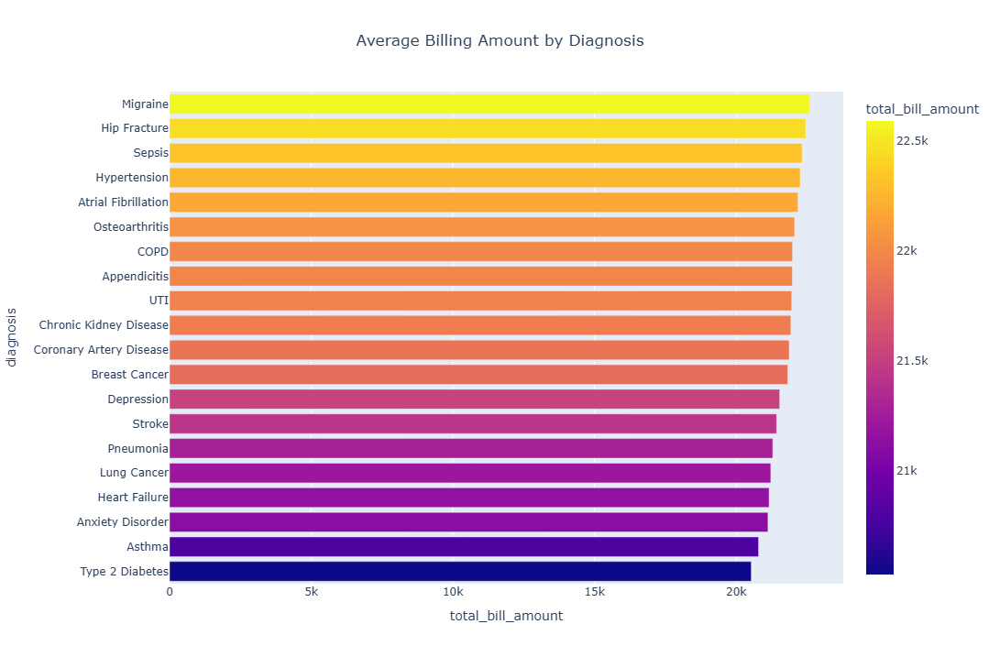

In [30]:
avg_bill = df.groupby('diagnosis')['total_bill_amount'].mean().reset_index()
avg_bill = avg_bill.sort_values('total_bill_amount')
fig = px.bar(
    avg_bill,
    x='total_bill_amount',
    y='diagnosis',
    orientation='h',
    color='total_bill_amount',
    title='Average Billing Amount by Diagnosis')
fig.update_layout(
    width=1200,
    height=700,
    title={'text': 'Average Billing Amount by Diagnosis','x': 0.5, 'xanchor': 'center'})
fig.show()

The average billing amount is relatively similar across all diagnoses, ranging approximately between 20k and 22.5k. Migraine and Hip Fracture have the highest average billing amounts, while Type 2 Diabetes and Asthma have the lowest. The small variation between diagnoses suggests that healthcare costs are fairly consistent across different medical conditions in this dataset.

In [ ]:
#2.Average Oxygen Saturation by Age Group

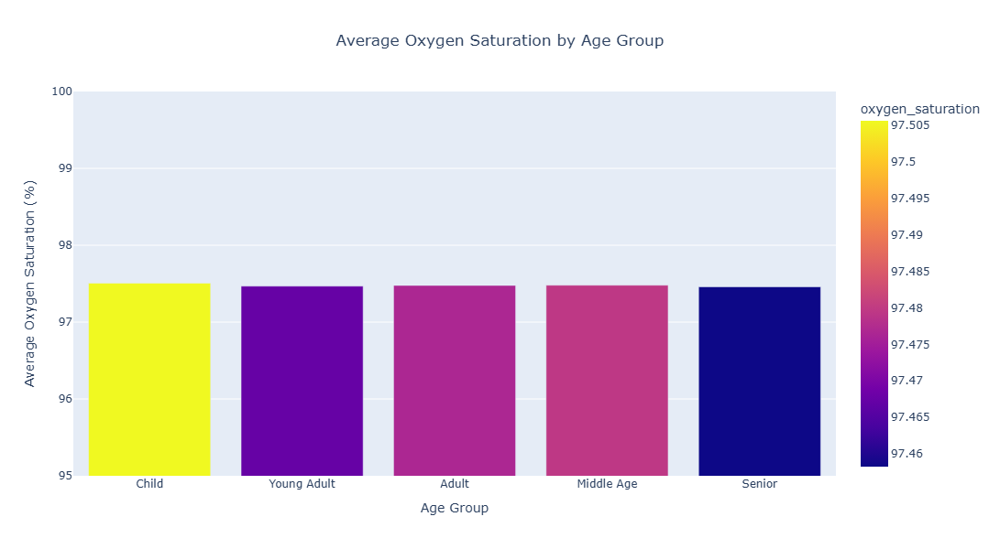

In [82]:
avg_oxygen = df.groupby('age_group')['oxygen_saturation'].mean().reset_index()
fig = px.bar(
    avg_oxygen,
    x='age_group',
    y='oxygen_saturation',
    color='oxygen_saturation',
    title='Average Oxygen Saturation by Age Group')
fig.update_layout(
    width=1000,
    height=600,
    title={'text': 'Average Oxygen Saturation by Age Group','x': 0.5,'xanchor': 'center'},
    xaxis_title='Age Group',
    yaxis_title='Average Oxygen Saturation (%)')
fig.update_yaxes(range=[95,100])
fig.show()

Oxygen saturation levels are stable across all age groups, with only minor variations observed.

<h4 style="font-size:20px;color:'cividis';">
9.2 GROUPED BAR CHART
</h4>

In [ ]:
#1.Average Glucose Level by Age Group and Gender

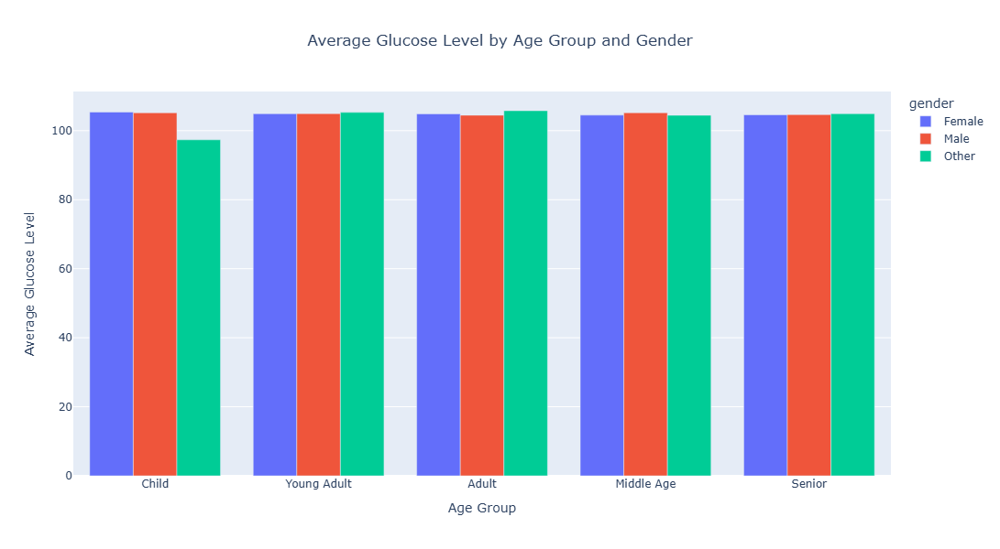

In [85]:
avg_glucose = df.groupby(['age_group', 'gender'])['glucose_level'].mean().reset_index()
fig = px.bar(
    avg_glucose,
    x='age_group',
    y='glucose_level',
    color='gender',
    barmode='group',
    title='Average Glucose Level by Age Group and Gender')
fig.update_layout(
    width=1000,
    height=600,
    title={'text': 'Average Glucose Level by Age Group and Gender','x': 0.5,'xanchor': 'center'},
    xaxis_title='Age Group',
    yaxis_title='Average Glucose Level')
fig.show()

The average glucose levels are relatively similar across all age groups and genders, generally ranging between 98 and 105. Female and male patients show very similar glucose levels within each age group, indicating minimal gender-based variation. The "Other" gender category shows slightly lower glucose levels in the child age group but remains comparable in the remaining age groups.

In [ ]:
#2.Average Billing Amount by Insurance Provioder and Admission Type

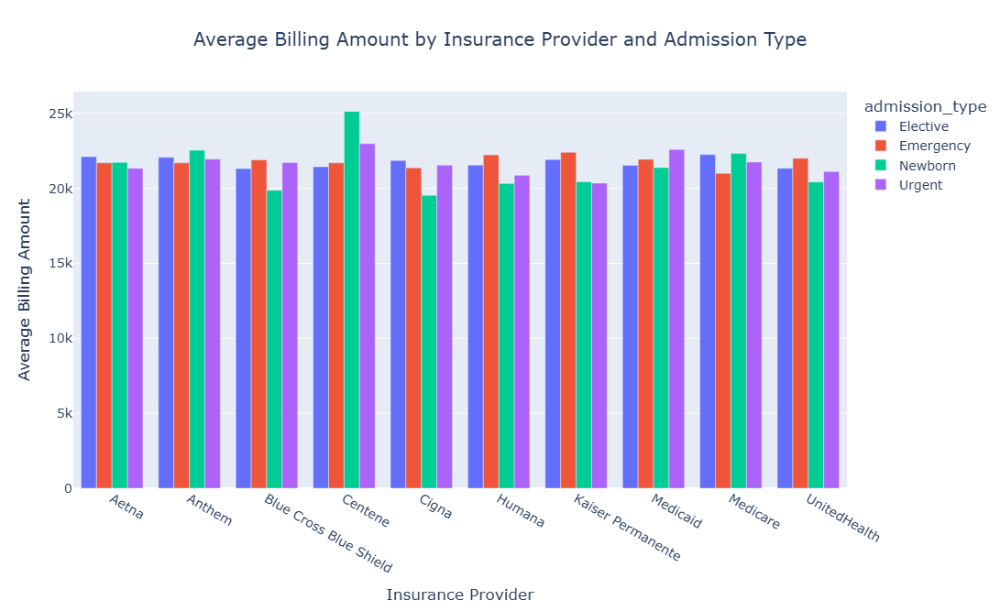

In [86]:
avg_bill = df.groupby(['insurance_provider', 'admission_type'])['total_bill_amount'].mean().reset_index()
fig = px.bar(
    avg_bill,
    x='insurance_provider',
    y='total_bill_amount',
    color='admission_type',
    barmode='group',
    title='Average Billing Amount by Insurance Provider and Admission Type')
fig.update_layout(
    width=1200,
    height=650,
    title={'text': 'Average Billing Amount by Insurance Provider and Admission Type','x': 0.5,'xanchor': 'center'},
    xaxis_title='Insurance Provider',
    yaxis_title='Average Billing Amount',
    font=dict(size=14))
fig.show()

The chart shows that average billing amounts are fairly consistent across most insurance providers, generally ranging between 20k and 25k. Among the providers, Centene records the highest average billing amount for the Newborn admission type, while some providers such as Cigna and Blue Cross Blue Shield show comparatively lower billing amounts for certain admission categories. Overall, the variation is moderate, indicating that both insurance provider and admission type have some influence on healthcare costs, but no extreme differences are observed.

<h4 style="font-size:20px;color:'cividis';">
9.3 PIE CHART and DONUT CHART
</h4>

In [88]:
#1.Admission Type Distribution

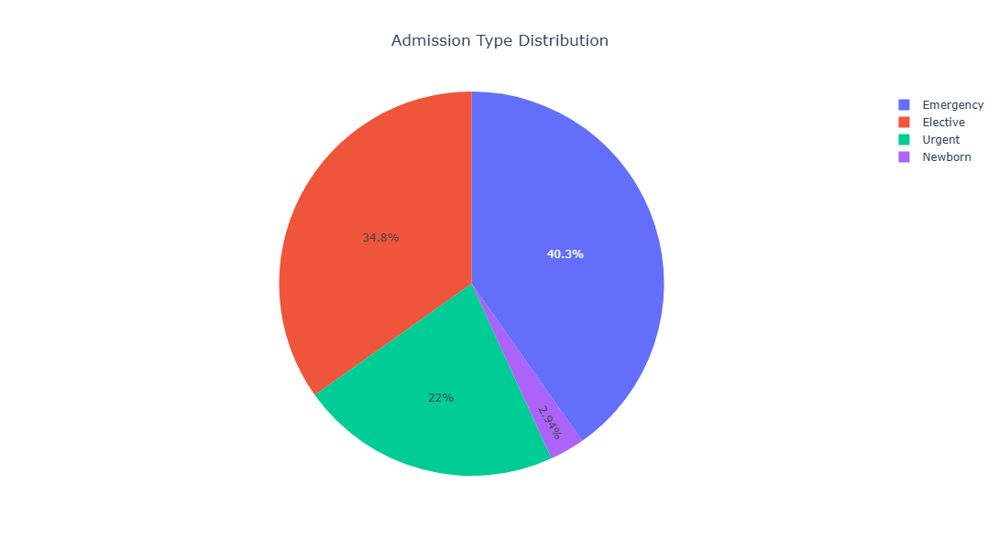

In [90]:
fig = px.pie(df,names='admission_type',title='Admission Type Distribution',)
fig.update_layout(
    width=800,
    height=600,
    title={'text': 'Admission Type Distribution','x': 0.5,'xanchor': 'center'})
fig.show()

Emergency admissions are the most common admission type (40.3%), followed by elective (34.8%) and urgent admissions (22%), while newborn admissions account for a very small proportion (2.9%).

In [91]:
#2.Readmission Risk Distribution

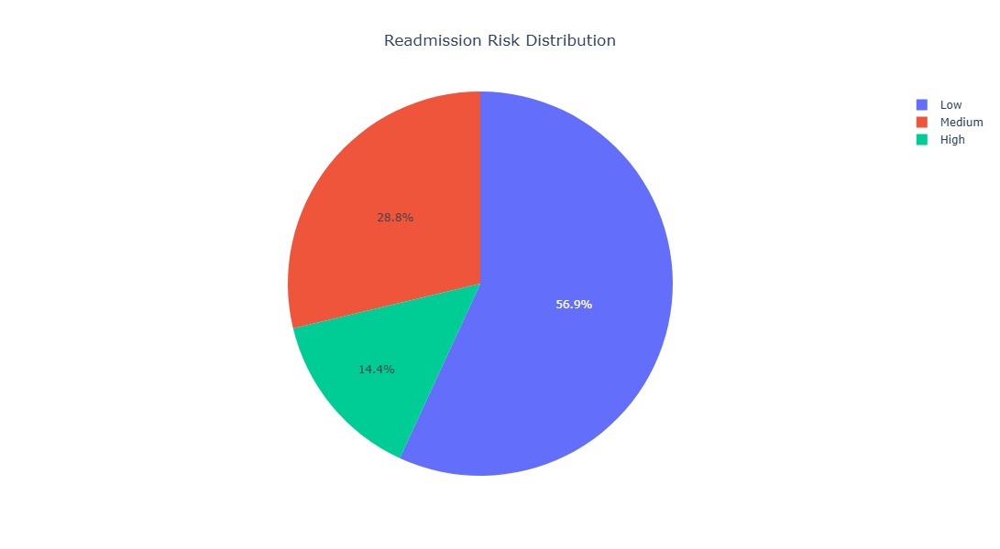

In [92]:
fig = px.pie(df,names='readmission_risk',title='Readmission Risk Distribution')
fig.update_layout(
    width=800,
    height=600,
    title={'text': 'Readmission Risk Distribution','x': 0.5,'xanchor': 'center'})
fig.show()

Most patients have a low risk of readmission, while only a small proportion are at high risk .This suggests a generally healthy patient population with a relatively small group requiring intensive follow-up and monitoring after discharge.

In [94]:
#3.Blood Type Distribution

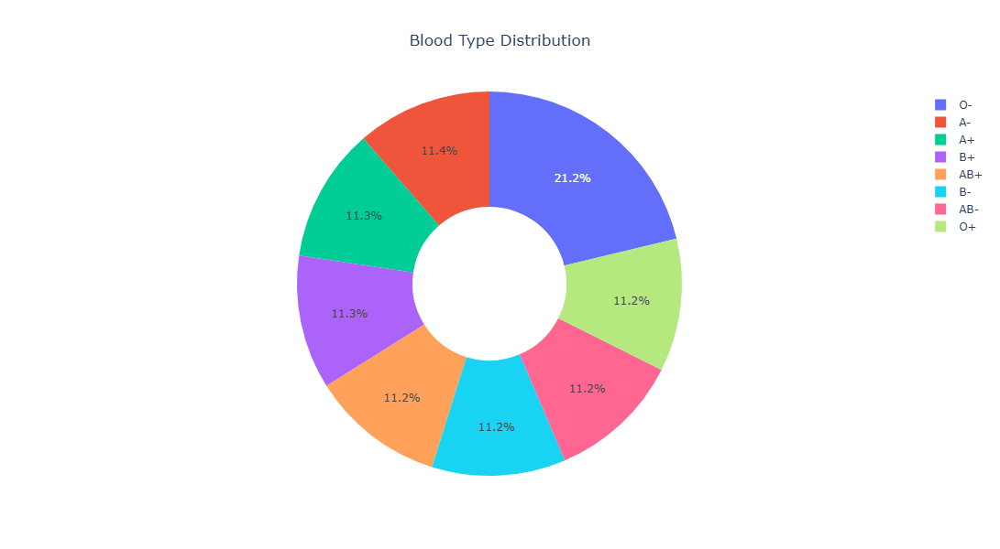

In [95]:
fig = px.pie(df,names='blood_type',title='Blood Type Distribution',hole=0.4)
fig.update_layout(
    width=800,
    height=600,
    title={'text': 'Blood Type Distribution','x': 0.5,'xanchor': 'center'})
fig.show()

The blood type distribution is generally balanced, with O− emerging as the most frequent blood group among patients.

<h4 style="font-size:20px;color:'cividis';">
9.4 LINE CHART
</h4>

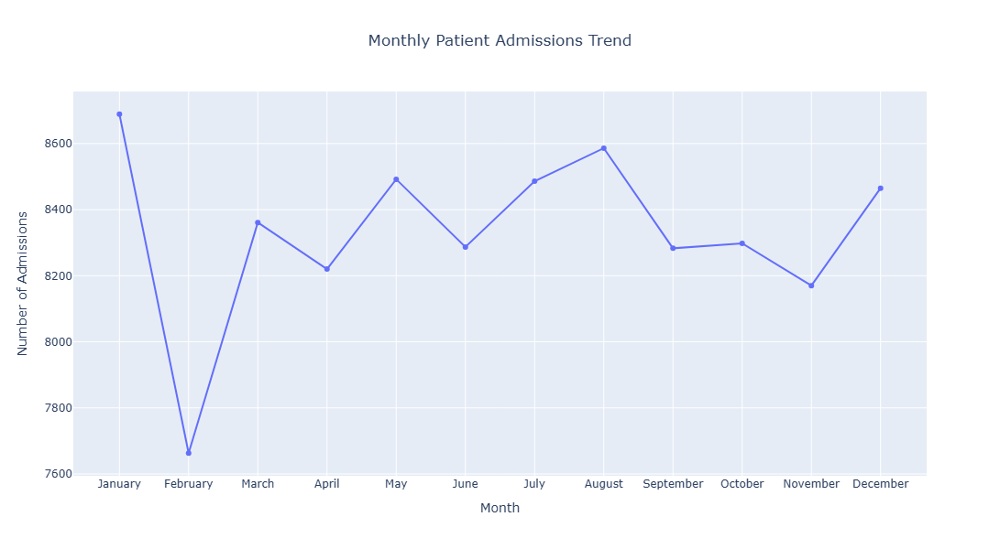

In [97]:
#Monthly Admission Trend
month_order = ['January','February','March','April','May','June','July','August','September','October','November','December']
df['admission_month'] = pd.Categorical(df['admission_month'],categories=month_order,ordered=True)
month_count = df['admission_month'].value_counts().reset_index()
month_count.columns = ['admission_month', 'count']
month_count = month_count.sort_values('admission_month')
fig = px.line(month_count,x='admission_month',y='count',markers=True,title='Monthly Patient Admissions Trend')
fig.update_layout(
    width=1000,
    height=600,
    title={'text': 'Monthly Patient Admissions Trend','x': 0.5,'xanchor': 'center'},
    xaxis_title='Month',
    yaxis_title='Number of Admissions')
fig.show()

The chart shows the total number of patient admissions in each month based on all records in the dataset. January has the highest number of admissions, while February has the lowest. After February, admissions fluctuate moderately across the remaining months, with another noticeable increase in August. Since the dataset includes records from multiple years, the chart represents the overall monthly admission pattern rather than the trend of a specific year.

<h4 style="font-size:20px;color:'cividis';">
9.5 SCATTER PLOT
</h4>

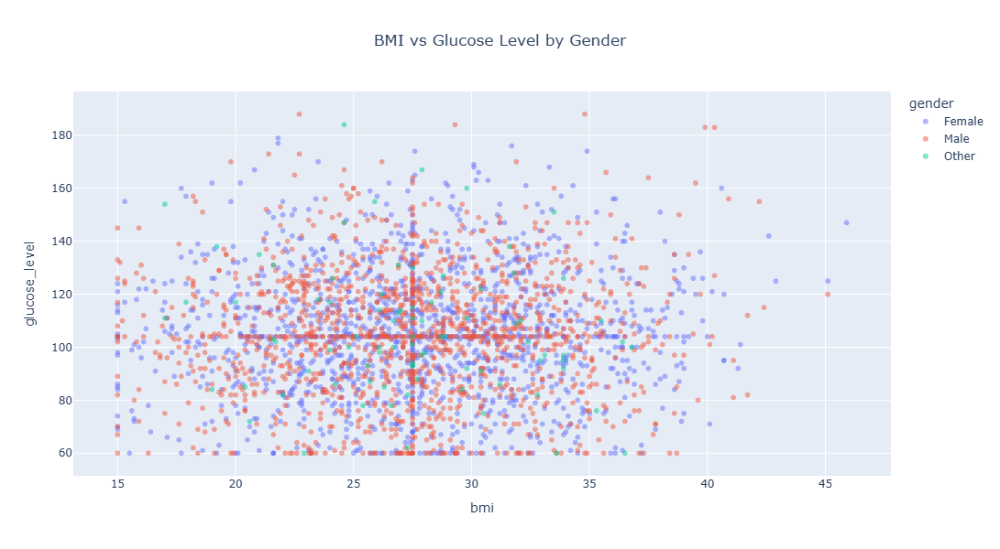

In [108]:
#1.BMI vs Glucose Level by Gender
fig = px.scatter(df.sample(3000),x='bmi',y='glucose_level',color='gender',opacity=0.5,title='BMI vs Glucose Level by Gender')
fig.update_layout(
    width=1000,
    height=600,
    title={'text': 'BMI vs Glucose Level by Gender','x': 0.5,'xanchor': 'center'},
    xaxis_title='bmi',
    yaxis_title='glucose_level')
fig.show()

Most patients have a BMI between 20–35 and glucose levels between 80–130. No strong correlation between BMI and glucose level is observed.

In [ ]:
#2.BMI vs Herat Rate

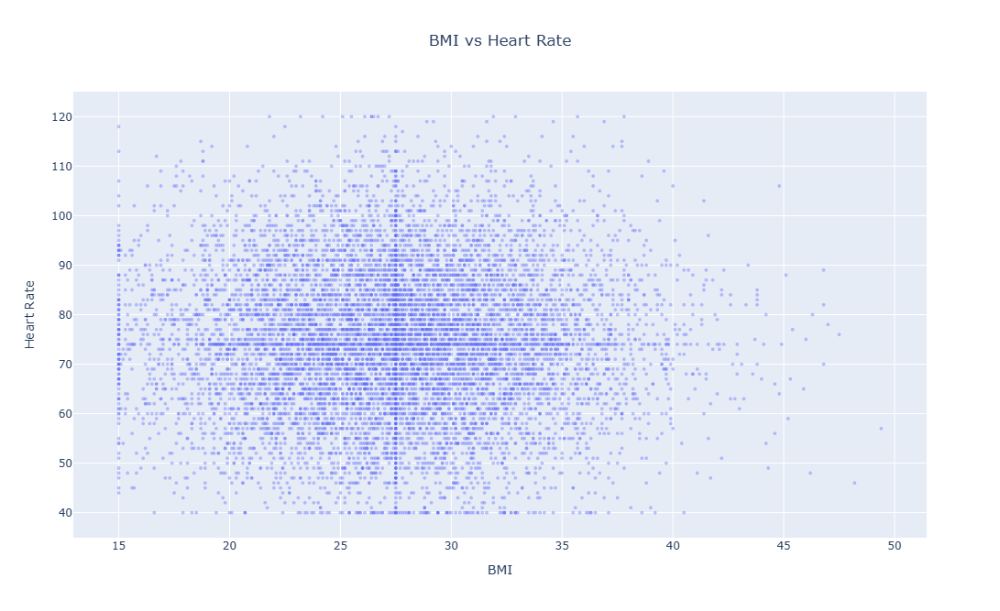

In [115]:
fig = px.scatter(df.sample(10000),x='bmi',y='heart_rate',opacity=0.4,title='BMI vs Heart Rate')
fig.update_traces(marker=dict(size=4))
fig.update_layout(
    width=1100,
    height=650,
    title={'text':'BMI vs Heart Rate','x':0.5,'xanchor':'center'},
    xaxis_title='BMI',
    yaxis_title='Heart Rate')
fig.show()

The scatter plot shows the relationship between BMI and heart rate. Most patients are concentrated within a BMI range of 20–35 and a heart rate range of 60–90 bpm. The points are widely scattered without a clear upward or downward trend, indicating a weak relationship between BMI and heart rate. This suggests that changes in BMI do not significantly affect heart rate in this dataset.

<h4 style="font-size:20px;color:'cividis';">
9.6 HISTOGRAM
</h4>

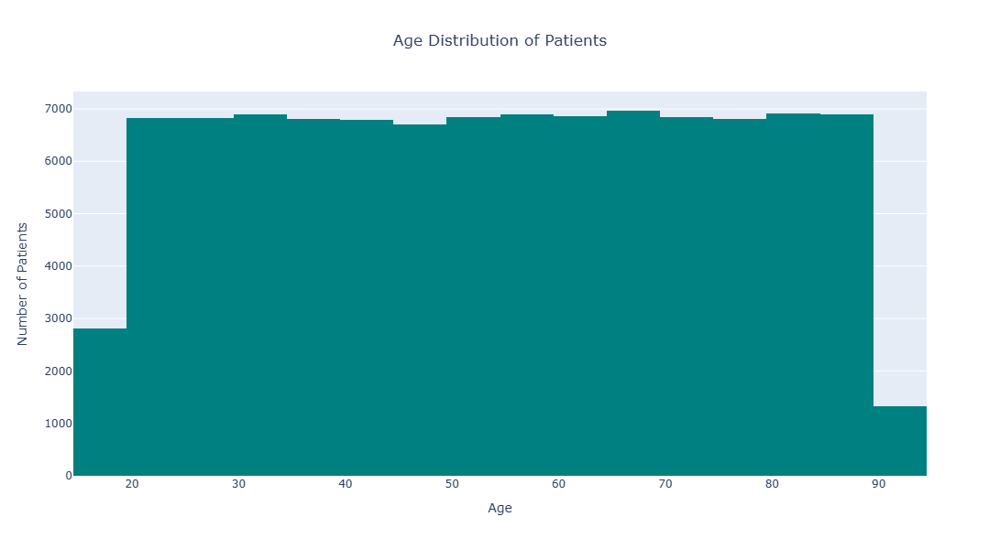

In [120]:
#Age Distribution of Patients
fig = px.histogram(df,x='age',nbins=25,color_discrete_sequence=['teal'],title='Age Distribution of Patients')
fig.update_layout(
    width=1000,
    height=600,
    title={'text':'Age Distribution of Patients','x':0.5,'xanchor':'center'},
    xaxis_title='Age',
    yaxis_title='Number of Patients')
fig.show()

The histogram indicates that patient ages are fairly evenly distributed from 18 to 90 years, with no dominant age group. This suggests that the dataset contains a balanced representation of patients across different age ranges.

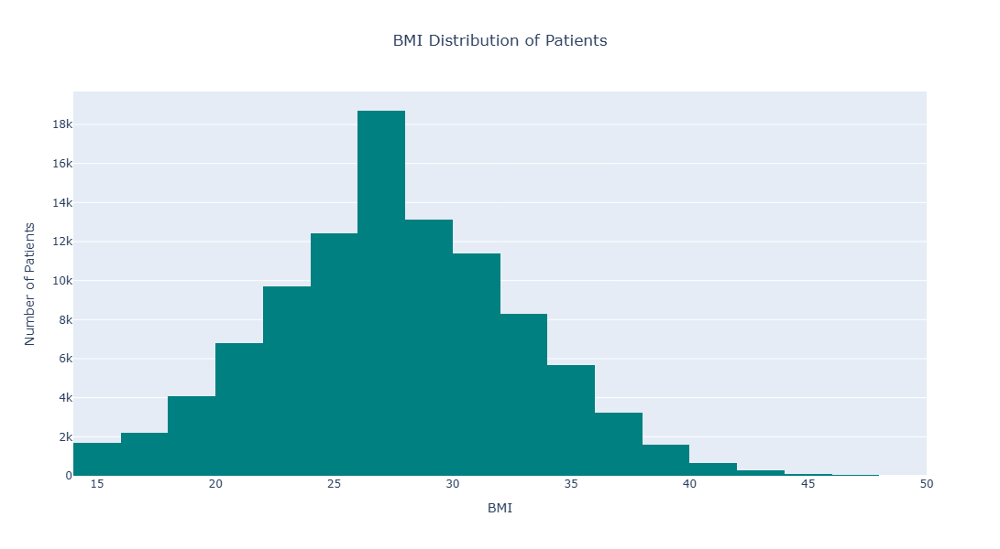

In [122]:
#2.BMI Distribution of Patients
fig = px.histogram(df,x='bmi',nbins=20,color_discrete_sequence=['teal'],title='BMI Distribution of Patients')
fig.update_layout(
    width=1000,
    height=600,
    title={'text':'BMI Distribution of Patients','x':0.5,'xanchor':'center'},
    xaxis_title='BMI',
    yaxis_title='Number of Patients')
fig.show()

The distribution is approximately bell-shaped, suggesting that BMI values are centered around the middle range.The number of patients gradually decreases as BMI moves away from the center toward very low or very high values.

<h4 style="font-size:20px;color:'cividis';">
9.7 HEATMAP
</h4>

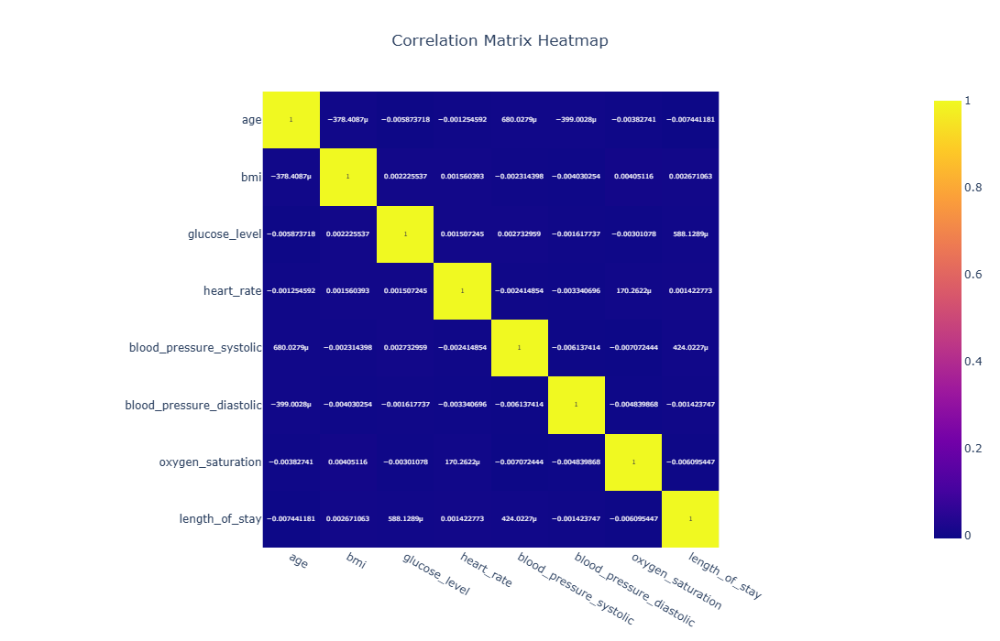

In [129]:
#1.Correlation Matrix Heatmap
corr_matrix = df[['age','bmi','glucose_level','heart_rate','blood_pressure_systolic','blood_pressure_diastolic',
                  'oxygen_saturation','length_of_stay']].corr()
fig = px.imshow(
    corr_matrix,
    text_auto=True,
    title='Correlation Matrix Heatmap')
fig.update_layout(
    width=900,
    height=700,
    title={'text':'Correlation Matrix Heatmap','x':0.5,'xanchor':'center'})
fig.show()

The correlation heatmap indicates that most variables have very weak correlations with each other. This suggests that factors such as age, BMI, glucose level, heart rate, blood pressure, oxygen saturation, and length of stay are largely independent in this dataset. No strong positive or negative relationship is observed among the variables.

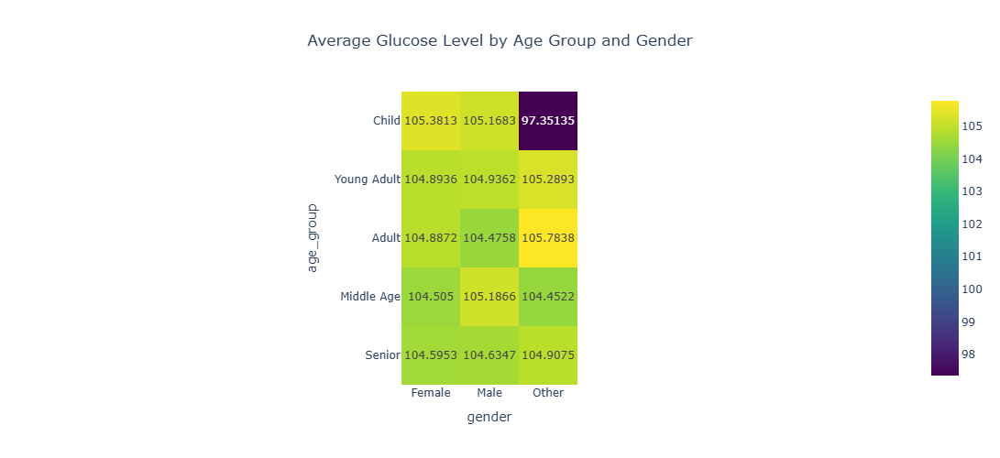

In [141]:
#2.Average Glucose Level by Age Group and Gender
heatmap_data = df.pivot_table(values='glucose_level',index='age_group',columns='gender',aggfunc='mean')
fig = px.imshow(
    heatmap_data,
    text_auto=True,
    color_continuous_scale='Viridis',
    title='Average Glucose Level by Age Group and Gender')
fig.update_layout(
    width=800,
    height=500,
    title={'text':'Average Glucose Level by Age Group and Gender',
           'x':0.5,
           'xanchor':'center'})
fig.show()

The heatmap shows that average glucose levels remain nearly constant across different age groups and genders. Only minor variations are observed, suggesting that age group and gender have limited influence on average glucose levels in this dataset.

<h4 style="font-size:20px;color:'cividis';">
9.8 BOX PLOT
</h4>

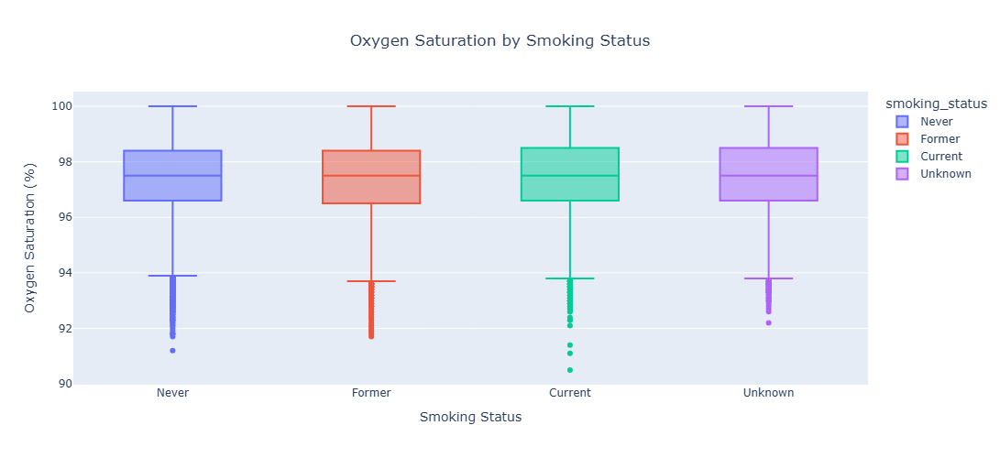

In [164]:
#Oxygen Saturation by Smoking Status
fig = px.box(df,x='smoking_status',y='oxygen_saturation',color='smoking_status',title='Oxygen Saturation by Smoking Status')
fig.update_layout(
    width=800,
    height=500,
    title={'text':'Oxygen Saturation by Smoking Status','x':0.5,'xanchor':'center'},
    xaxis_title='Smoking Status',
    yaxis_title='Oxygen Saturation (%)')
fig.show()

The box plot compares oxygen saturation levels across different smoking status categories. Most groups have similar median oxygen saturation values and comparable distributions. However, a few lower outliers are observed among current smokers, suggesting that some individuals in this group experience reduced oxygen saturation. Overall, the relationship between smoking status and oxygen saturation appears weak in this dataset.

<h4 style="font-size:20px;color:'cividis';">
9.9 TREE MAP
</h4>

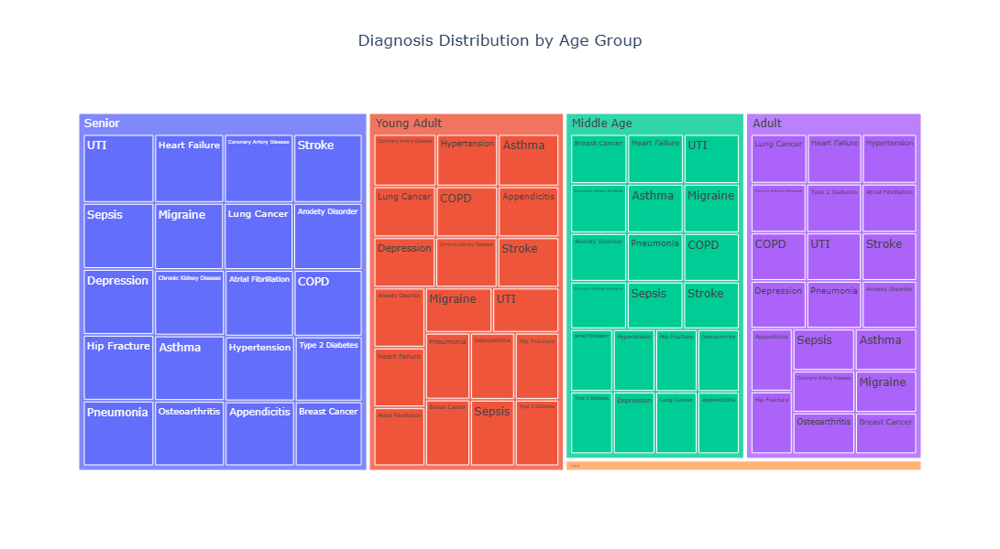

In [165]:
#Diagnosis Distribution by Age Group
fig = px.treemap(df,path=['age_group', 'diagnosis'],
    title='Diagnosis Distribution by Age Group')
fig.update_layout(
    width=1000,
    height=600,
    title={'x':0.5})
fig.show()

The visualization highlights how disease occurrence differs across different stages of life, helping identify age-related health patterns.Senior and Young Adult groups have a larger share of patients, while the Child group has fewer cases.

<h4 style="font-size:20px;color:'cividis';">
9.10 VIOLIN CHART
</h4>

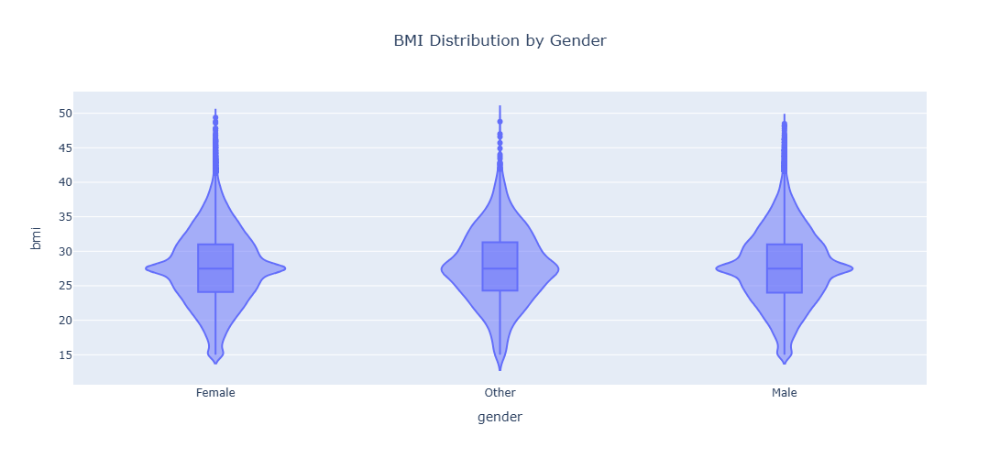

In [161]:
#BMI Distribution by Gender
fig = px.violin(df,x='gender',y='bmi',box=True,points='outliers',title='BMI Distribution by Gender')
fig.update_layout(
    width=800,
    height=500,
    title={'text':'BMI Distribution by Gender',
           'x':0.5,
           'xanchor':'center'})
fig.show()

The violin plot shows that BMI distribution is fairly similar across all genders. Most patients have BMI values between 25 and 32, with female patients showing a slightly higher median BMI. A few high-BMI outliers are present in all gender groups, but no major gender-based differences are observed.

<h4 style="font-size:20px;color:'cividis';">
9.11 SUNBURST CHART
</h4>

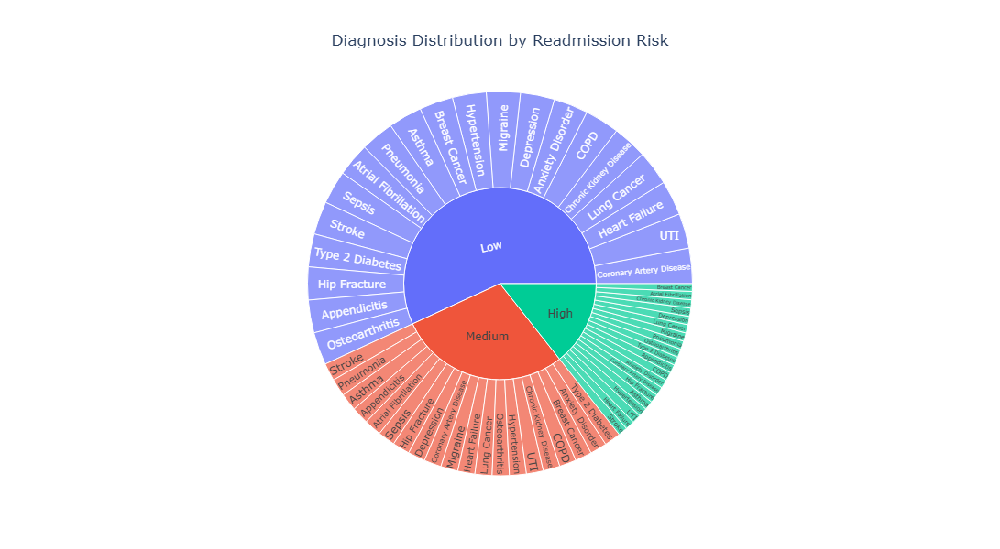

In [171]:
#Diagnosis Distribution by Readmission Risk
fig = px.sunburst(df,path=['readmission_risk', 'diagnosis'],
    title='Diagnosis Distribution by Readmission Risk')
fig.update_layout(
    width=1000,
    height=600,
    title={'text':'Diagnosis Distribution by Readmission Risk',
           'x':0.5,
           'xanchor':'center'})
fig.show()

Low Readmission Risk is the largest category.This indicates that most patients have a lower chance of being readmitted.Medium Readmission Risk is the second largest category.Only a smaller portion of patients are classified as high-risk.Diagnoses are distributed across all risk levels, indicating that readmission risk is not determined by diagnosis alone but is influenced by multiple clinical factors.

<h3 style="font-size:35px;color:#1F4E79;">
10.Insight generation and Report
</h3>

<h4 style="font-size:20px;color:'cividis';">
KEY INSIGHTS
</h4>

1.The dataset contains a diverse patient population across different age groups, genders, and medical conditions.

2.Average billing amounts vary across diagnoses, insurance providers, and admission types, highlighting differences in healthcare costs and treatment complexity.

3.Cholesterol and glucose levels show moderate variation among patients, indicating differences in metabolic health conditions.

4.Most patients fall under the Low Readmission Risk category, while only a smaller proportion are classified as Medium or High risk.

5.Correlation analysis revealed generally weak relationships among clinical variables, suggesting that patient outcomes are influenced by multiple factors rather than a single variable.

6.BMI values are concentrated around the normal to overweight range, with a few extreme values observed across all demographic groups.

7.Length of stay differs across patient groups and medical conditions, indicating varying levels of healthcare resource utilization.

8.Oxygen saturation and heart rate distributions remain relatively stable across smoking-status categories, with only minor variations observed.

9.Treemap and Sunburst visualizations showed that patient diagnoses are distributed across all demographic groups without a single diagnosis overwhelmingly dominating the dataset.

10.Multivariate analysis helped identify patterns between demographic, clinical, and financial variables, providing a broader understanding of patient health and healthcare expenditure.

<h4 style="font-size:20px;color:'cividis';">
CONCLUSION
</h4>

The Clinical and Financial Healthcare Analytics project successfully analyzed healthcare data by combining clinical, demographic, admission, diagnosis, insurance, and billing information. Through exploratory data analysis, pivot table analysis, and various visualizations, important patterns and relationships were identified across different patient groups. The analysis showed that the dataset contains a diverse patient population with varying health conditions, while most patients fall under the low readmission risk category. Clinical factors such as BMI, glucose level, cholesterol level, heart rate, blood pressure, and oxygen saturation exhibited variations across age groups, genders, smoking status, and diagnoses. Financial analysis revealed differences in billing amounts among diagnoses, insurance providers, and admission types, highlighting the impact of healthcare services on costs. Overall, the project demonstrates the value of healthcare analytics in transforming raw data into meaningful insights that can support better patient care, efficient resource management, reduced readmission risk, and informed clinical and financial decision-making in healthcare organizations.

<h4 style="font-size:20px;color:'cividis';">
RECOMMENDATIONS
</h4>

1.Based on the findings of this study, healthcare organizations should strengthen preventive care initiatives and promote regular health screenings to identify potential health risks at an early stage. 

2.Patients with elevated clinical indicators such as high BMI, glucose levels, cholesterol levels, and blood pressure should be monitored closely through personalized care plans and lifestyle management programs.

3.Hospitals can improve patient outcomes by implementing targeted follow-up strategies for individuals with medium and high readmission risk, thereby reducing unnecessary hospital readmissions.

4.Interactive dashboards and real-time monitoring systems can also be developed to support better clinical and financial decision-making.


<h4 style="font-size:20px;color:'cividis';">
FUTURE SCOPE
</h4>

The project can be further enhanced by incorporating machine learning and predictive analytics techniques to forecast readmission risk, patient outcomes, and healthcare costs.Advanced models can help identify high-risk patients at an early stage and support preventive interventions. Additionally, interactive dashboards and real-time monitoring systems can be developed to improve clinical decision-making, resource allocation, and overall healthcare management.